`CHAPTER 3`

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Mixing Imagination and Reality with Style Transfer
## Can ResNet or other networks be used for seeing through the lens of the past?

#### Imported packages

In [3]:
%matplotlib inline

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

In [5]:
from PIL import Image

In [6]:
import IPython.display
import time
import functools
import os

In [7]:
import tensorflow as tf

In [8]:
from skimage.io import imread, imshow
from skimage.transform import resize

In [9]:
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras import models
from tensorflow.keras import losses
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.applications import vgg19
from tensorflow.keras.applications import resnet_v2

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input

#### Constants

###### Pair of Images No. 0

In [10]:
CONTENT_PATH = "/content/drive/MyDrive/DL Project/1_New_York.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/1_New_York.jpg
STYLE_PATH = "/content/drive/MyDrive/DL Project/1_rembrandt.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/1_rembrandt.jpg

###### Pair of Images No. 1

In [11]:
CONTENT_PATH_1 = "/content/drive/MyDrive/DL Project/2_Maldives.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/2_Maldives.jpg
STYLE_PATH_1 = "/content/drive/MyDrive/DL Project/2_Claude_Monet_Landscape.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/2_Claude_Monet_Landscape.jpg

###### Pair of Images No. 2

In [12]:
CONTENT_PATH_2 = "/content/drive/MyDrive/DL Project/3_Stars_over_hunters_beach.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/3_Stars_over_hunters_beach.jpg
STYLE_PATH_2 = "/content/drive/MyDrive/DL Project/3_Starry_Night_van_Gogh.jpg"
# C:/Users/aneta/OneDrive/Documents/07_Deep_learning/10_Project/pictures/3_Starry_Night_van_Gogh.jpg

#### Eager Execution

In [13]:
tf.executing_eagerly()
print("Eager Execution: {}".format(tf.executing_eagerly()))

Eager Execution: True


## 3. Style Transfer with ResNet implementation

#### 3.1. ResNet Architecture

Residual Networks, or ResNet, invented by a Microsoft's team, won ImageNet competition in 2015. ResNet is much deeper than VGG16 and VGG19. He et al.[11] think that "network depth is of crucial importance", and for this reason the leading results on ImageNet challenge all exploit “very deep” models. They wonder if "learning better networks [is] as easy as stacking more layers?" He and his colleagues analyse the problem of vanishing/exploding gradients, which hamper convergence, and consider it a serious obstacle to answering this question. 

They found that with increasing network, accuracy gets saturated and then degrades rapidly. Сt was established that such degradation is not caused by overfitting, and adding more layers to a suitably deep model leads to higher training error. Thus, He et al. addressed this problem by introducing a **deep residual learning framework**. In simple words, they added "shortcut connections", which skip one or more layers. Outputs of shortcut connections are added to the outputs of the stacked layers. It should be noted here that shortcut connections add neither extra parameters nor computational complexity.

A general view of ResNet architecture is shown in Figure 3. Its elements are further examined below.

**Figure 3. ResNet architecture**

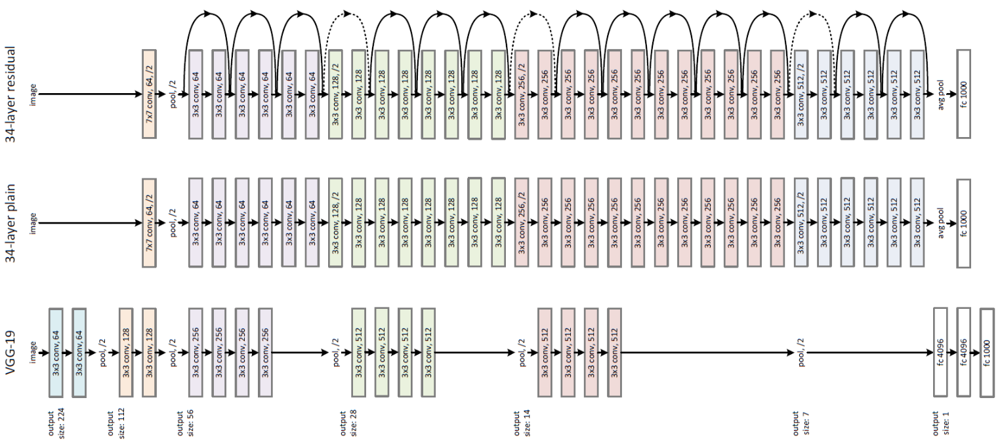

Source: *Review: ResNet — Winner of ILSVRC 2015 (Image Classification, Localization, Detection)*, [Medium](https://towardsdatascience.com/review-resnet-winner-of-ilsvrc-2015-image-classification-localization-detection-e39402bfa5d8)

The figure above compares VGG19 with a 34-layer plain CNN, and with a 34-layer Residual Network. The latter are identical except the shortcut connections (in ResNet), which carry activations between layers. The residual function is defined as $F(x) = H(x) - x$, which can be reframed into $H(x) = F(x) + x$, where $F(x)$ and $x$ represent the stacked non-linear layers and the identity function, respectively.

Keras comes with three preloaded ResNet configurations: ResNet50, ResNet101, and ResNet152. The attempt to transfer style is made with ResNet50 since the other two architectures are too large. The code lines below load the whole ResNet50, pre-trained on ImageNet. It is saved in `resnet50_model`. Its summary is displayed thereafter.

In [14]:
resnet50_model = resnet_v2.ResNet50V2(include_top = True, weights = "imagenet")

102875136/102869336 [==============================] - 1s 0us/step


In [15]:
resnet50_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

ResNet is much deeper than VGG but it has 143.6 million parameters, whereas ResNet50 - only 25.6 million. ResNet50 layers, filters, and its overall architecture are illustrated in Figure 4.

**Figure 4. ResNet50 architecture**

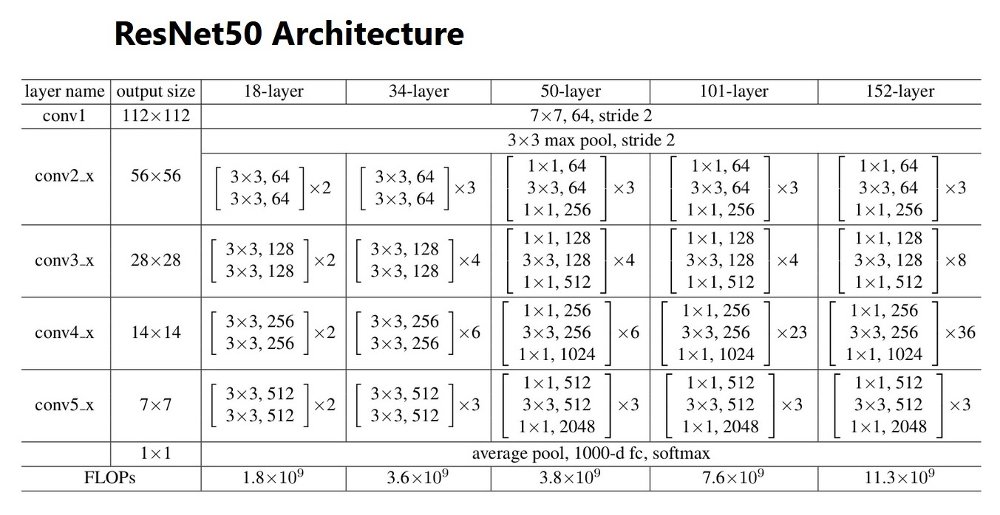

Source: He et al.[11] *Deep Residual Learning for Image Recognition*

ResNet convolutional sections are in the first column. Next to them are layers output size. Each configuration examined by He et al. is visualized thereafter. ResNet50 (middle column) is composed of the following elements:

* `conv1`: A convolution with a kernel (filter) sized 7 × 7. The layer has 64 different kernels, all with stride of 2;

* Next is a `Max pooling` layer, also having stride size of 2; 

* `conv2_x`: There is a sequence of layers in the next convolutional section. The first one is with 64 kernels, sized 1 × 1, followed by another 64 filters, 3 × 3; the last has 256 kernels, sized 1 × 1. These three layers are repeated 3 times to make `conv2_x` having 9 layers in total;

* `conv3_x`: Next, there is a layer with 128 kernels of size 1 × 1, followed by another 128 larger kernels (3 × 3); the last layer is larger, with 512 filters but of smaller size (1 × 1). This configuration is repeated 4 times, so there are 12 layers in the third convolutional block at the end;

* `conv4_x`: Section 3 is followed by a layer of 256 kernels sized 1 × 1, by another composed of 256 kernels (but of larger size, 1 × 1), and by a layer of 1024 smaller filters (1 × 1). All these are repeated 6 times to produce a block of 18 layers; 

* `conv5_x`: The last section is composed of blocks of three layers, each larger than the ones in the preceding block. The first has 512 kernels, sized 1 × 1; the second is identical - 512 but with larger filters (3 × 3). The last one has the largest number of kernels (2048) but their sized only 1 × 1. This combination is repeated 3 times to produce a total number of 9 layers;

* There is a "GlobalAveragePooling2" layer on top of all five convolutional sections, which links convolutions with a Dense layer of 1000 units (in line with ImageNet classes);

* All convolutional layers perform computations with "ReLU" activation function. Only the last (Dense) layer uses "softmax", which is appropriate for multi-label classification.

All these layers and configurations results in a deep net of 50 layers. It should be noted here that paddings and activations are initialized as separate layers in the original architecture. These, as well as `MaxPooling()` and `BatchNormalization()` layers are not taken into account in determining ResNet50's size. Residual units are located between convolutional blocks. A detailed scheme of a residual unit is shown in Figure 5.

**Figure 5. Scheme of a residual unit**

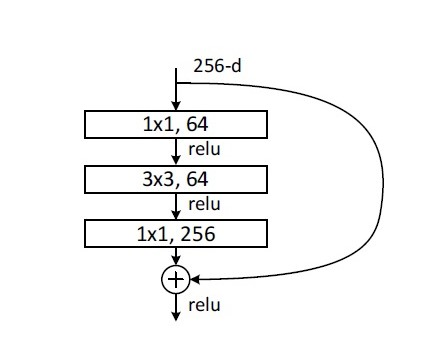

Source: He et al.[11] *Deep Residual Learning for Image Recognition*

In terms of convolutional block `conv2_x`, all activations of the layer preceding the first convolution (64, 1 × 1) are concatenated with those resulting from the last convolution (256, 1 × 1) in the largest layer. The shape of output data and of input values in residual units should be identical. 

ResNet50 summary shows that it has not only convolutional, but `BatchNormalization()` and `MaxPooling()` layers, too, which help for keeping network's capacity and complexity under control. It might be assumed that the layers which get concatenated data hold the most "valuable" information. The next sub-chapter explores this hypothesis and chooses the most appropriate for Style Transfer.

#### 3.2. Define Content and Style Representation [ResNet]

Perhaps one of the most important questions for doing Style Transfer is **how to choose content and style layers**. Several attempts with different layer combinations were tried and tested, and none proved successful enough. 

As mentioned a few lines above, it is assumed that the layers which get concatenated activations hold the most "valuable" information. In ResNet, these are titled “Add”. However, "Add" layers (implementing shortcut connections) have neither parameters, nor kernels, and it is impossible to use them for whatever transfer.

##### Get layers with the highest number of parameters

Another approach for selecting content and style layers might be the **number of parameters (weights)** they are associated with. The assumption is: *the higher this number is, the valuable the layer is for preserving style and content*. However, the information they hold would be useless if these layers produce zero-activations. Therefore, layers with the largest number of weights in each convolutional block are examined below. To that end, a variable holding these layers' index is initiated (`resnet_layers_to_examine`). Prior to that layers indices and names are displayed.

In [16]:
# Display layer index and name
[(index, layer.name) for (index, layer) in enumerate(resnet50_model.layers)]

[(0, 'input_1'),
 (1, 'conv1_pad'),
 (2, 'conv1_conv'),
 (3, 'pool1_pad'),
 (4, 'pool1_pool'),
 (5, 'conv2_block1_preact_bn'),
 (6, 'conv2_block1_preact_relu'),
 (7, 'conv2_block1_1_conv'),
 (8, 'conv2_block1_1_bn'),
 (9, 'conv2_block1_1_relu'),
 (10, 'conv2_block1_2_pad'),
 (11, 'conv2_block1_2_conv'),
 (12, 'conv2_block1_2_bn'),
 (13, 'conv2_block1_2_relu'),
 (14, 'conv2_block1_0_conv'),
 (15, 'conv2_block1_3_conv'),
 (16, 'conv2_block1_out'),
 (17, 'conv2_block2_preact_bn'),
 (18, 'conv2_block2_preact_relu'),
 (19, 'conv2_block2_1_conv'),
 (20, 'conv2_block2_1_bn'),
 (21, 'conv2_block2_1_relu'),
 (22, 'conv2_block2_2_pad'),
 (23, 'conv2_block2_2_conv'),
 (24, 'conv2_block2_2_bn'),
 (25, 'conv2_block2_2_relu'),
 (26, 'conv2_block2_3_conv'),
 (27, 'conv2_block2_out'),
 (28, 'conv2_block3_preact_bn'),
 (29, 'conv2_block3_preact_relu'),
 (30, 'conv2_block3_1_conv'),
 (31, 'conv2_block3_1_bn'),
 (32, 'conv2_block3_1_relu'),
 (33, 'conv2_block3_2_pad'),
 (34, 'conv2_block3_2_conv'),
 (35,

In [17]:
# Get index of layers for further examination
resnet50_layers_to_examine = [2, 11, 23, 34, 46, 58, 69, 80, 92, 104, 115, 126, 137, 148, 160, 172, 183]

Weights distribution in the selected layers is displayed below. Values on "x" axis are limited in the range [-0.5, 0.5], which enables comparisons. Restricting values on "y" is pointless.

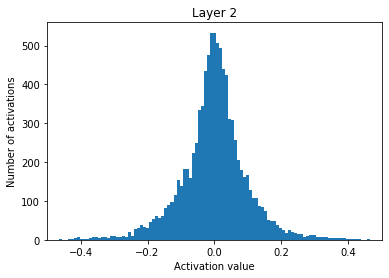

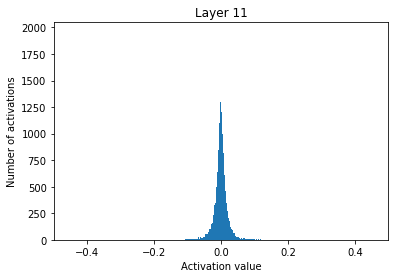

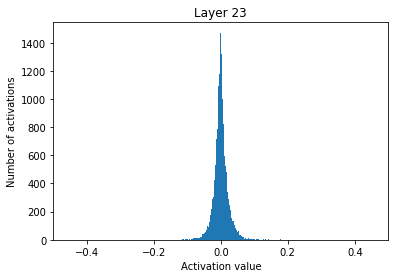

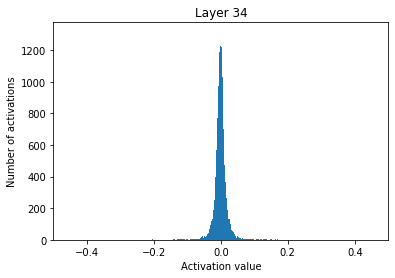

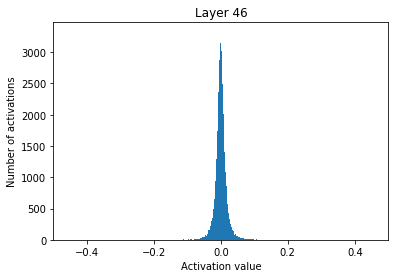

...

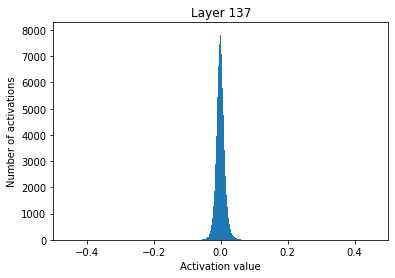

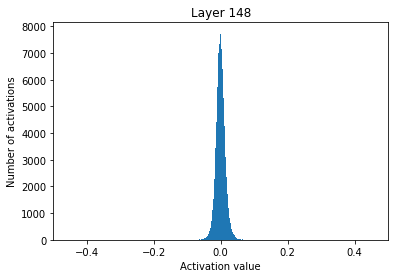

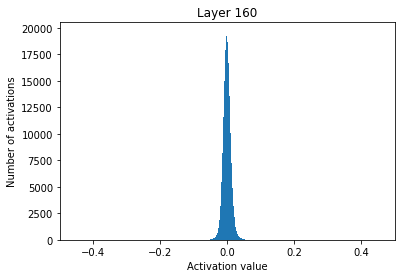

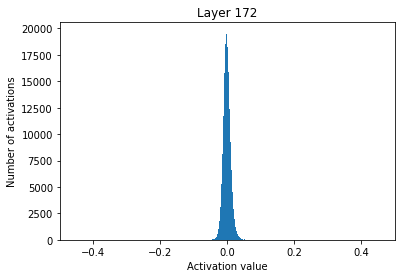

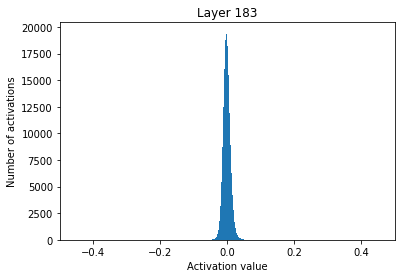

In [18]:
# Display weights distribution of chosen layers
for i in resnet50_layers_to_examine:
    plt.figure(figsize = (6, 4))
    plt.hist(resnet50_model.layers[i].kernel.numpy().ravel(), bins = "fd")
    plt.xlim(-0.5, 0.5)
    plt.title(f"Layer {i}")
    plt.xlabel("Activation value")
    plt.ylabel("Number of activations")
    plt.show()

These results are not of much help. Weights are centered around zero. Values' distribution is broader in lower layers, but more and more activations get closer to zero over time. Thus, regardless of weights’ large number in examined layers, it seems the latter is not so important for activations. Nonetheless, these layers were used in a Style Transfer trial, which failed. 

##### Get layers with similar feature maps
###### VGG19

A third approach to choose layers is to compare feature maps of benchmark model (VGG19) and ResNet50. If not impossible, but impractical is to display all feture maps of all layers. Therefore, the idea here is to compare the first 64 activations of VGG19 layers chosen for style transfer in the exercise in Chapter 2, with those resulted from layers of ResNet50 located at the end of each convolutional section. This demands loading VGG19 again and examining the layers used for style transfer. Feature map visualization follows the steps outlined [here](https://machinelearningmastery.com/how-to-visualize-filters-and-feature-maps-in-convolutional-neural-networks/).

Loaded VGG19 achitecture is followed by a list of layers' indices and names.

In [19]:
vgg19_model = vgg19.VGG19(include_top = False, weights = "imagenet")

80142336/80134624 [==============================] - 0s 0us/step


In [20]:
[(index, layer.name) for (index, layer) in enumerate(vgg19_model.layers)]

[(0, 'input_2'),
 (1, 'block1_conv1'),
 (2, 'block1_conv2'),
 (3, 'block1_pool'),
 (4, 'block2_conv1'),
 (5, 'block2_conv2'),
 (6, 'block2_pool'),
 (7, 'block3_conv1'),
 (8, 'block3_conv2'),
 (9, 'block3_conv3'),
 (10, 'block3_conv4'),
 (11, 'block3_pool'),
 (12, 'block4_conv1'),
 (13, 'block4_conv2'),
 (14, 'block4_conv3'),
 (15, 'block4_conv4'),
 (16, 'block4_pool'),
 (17, 'block5_conv1'),
 (18, 'block5_conv2'),
 (19, 'block5_conv3'),
 (20, 'block5_conv4'),
 (21, 'block5_pool')]

Layers 1, 4, 7, 12, 17, and 18 of VGG19 were used for style transfer. Their outputs are stored in `outputs`. 

In [21]:
vgg19_layers = [1, 4, 7, 12, 17, 18]

In [22]:
outputs = [vgg19_model.layers[i].output for i in vgg19_layers]

A new model (`model_vgg19`) is initialized with inputs as those in the original VGG19, and outputs taken from selected layers.

In [23]:
model_vgg19 = Model(inputs = vgg19_model.inputs, outputs = outputs)

`CONTENT` image is loaded with the required shape (`image_fm`). Thereafter, the image is converted into a numpy array; its dimensions are expanded so that it represents a single "sample", and its values - preprocessed for VGG use (the funcions above are not used for avoiding collisions). `feature_maps` are extracted by applying `predict()` to the model. 

In [24]:
image_fm = load_img(CONTENT_PATH, target_size = (224, 224))
image_fm = img_to_array(image_fm)
image_fm = tf.expand_dims(image_fm, axis = 0)
image_fm = vgg19.preprocess_input(image_fm)

In [25]:
feature_maps_vgg19 = model_vgg19.predict(image_fm)

Plotting arrangements for feature maps are stored in a function since the same computations and visualizations are perforemd for ResNet50 below.

In [26]:
def plot_feature_maps(feature_maps):
    # plot the output from each block
    square = 8
    for fmap in feature_maps:
        # plot all 64 maps in an 8x8 squares
        ix = 1
        plt.figure(figsize = (18, 18))
        for _ in range(square):
            for _ in range(square):
                # specify subplot and turn of axis
                ax = plt.subplot(square, square, ix)
                ax.set_xticks([])
                ax.set_yticks([])
                # plot filter channel in grayscale
                plt.imshow(fmap[0, :, :, ix-1], cmap = "gray")
                ix += 1
        plt.show()

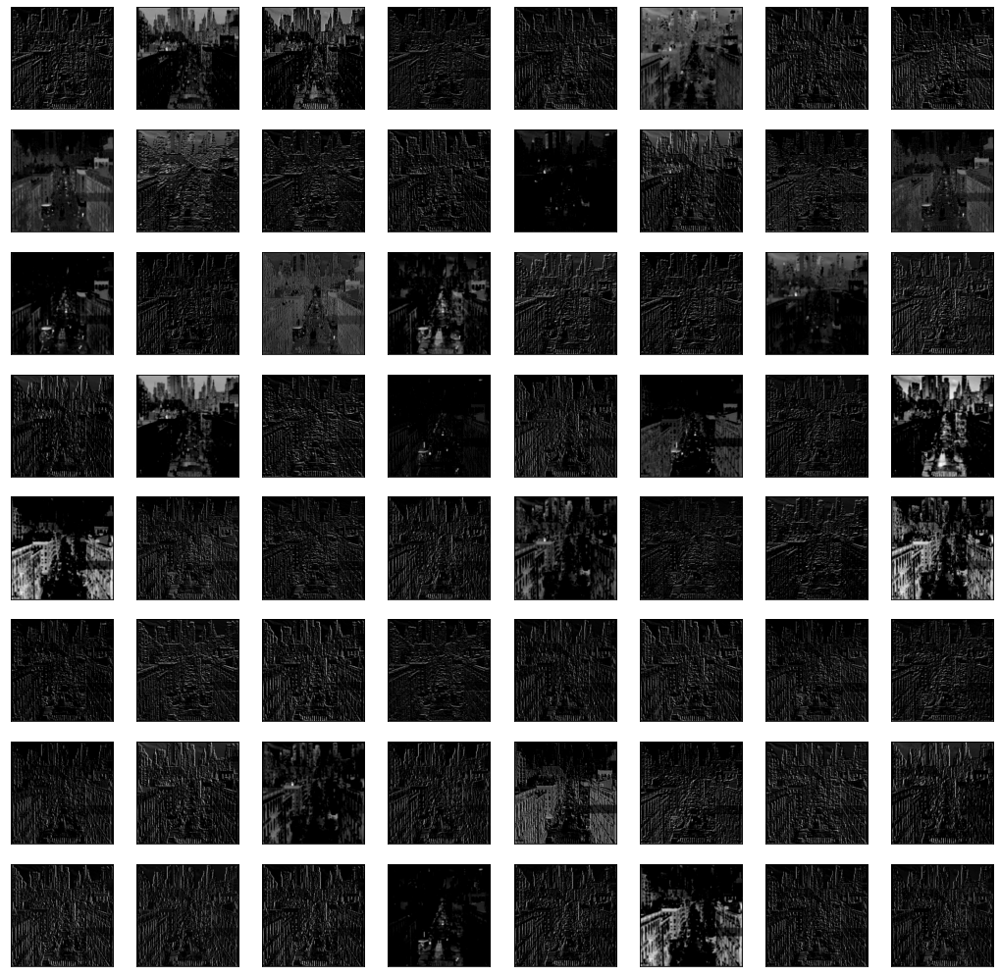

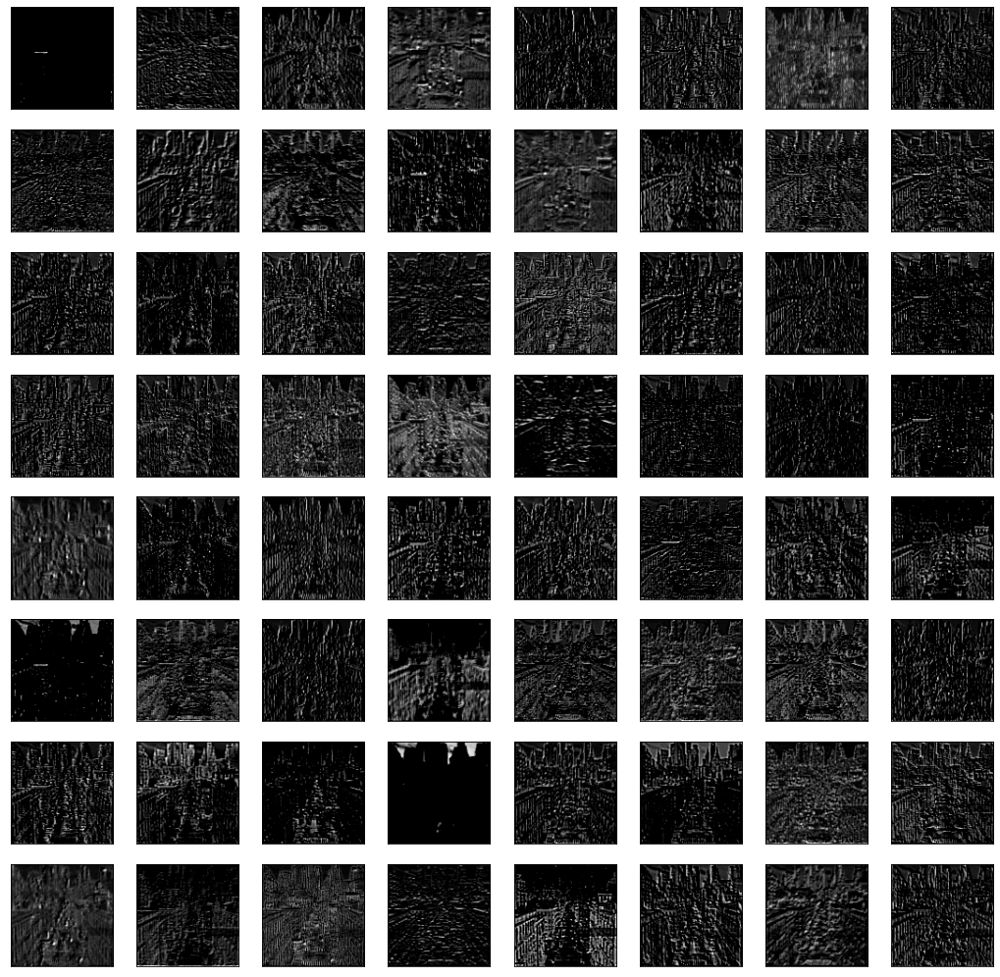

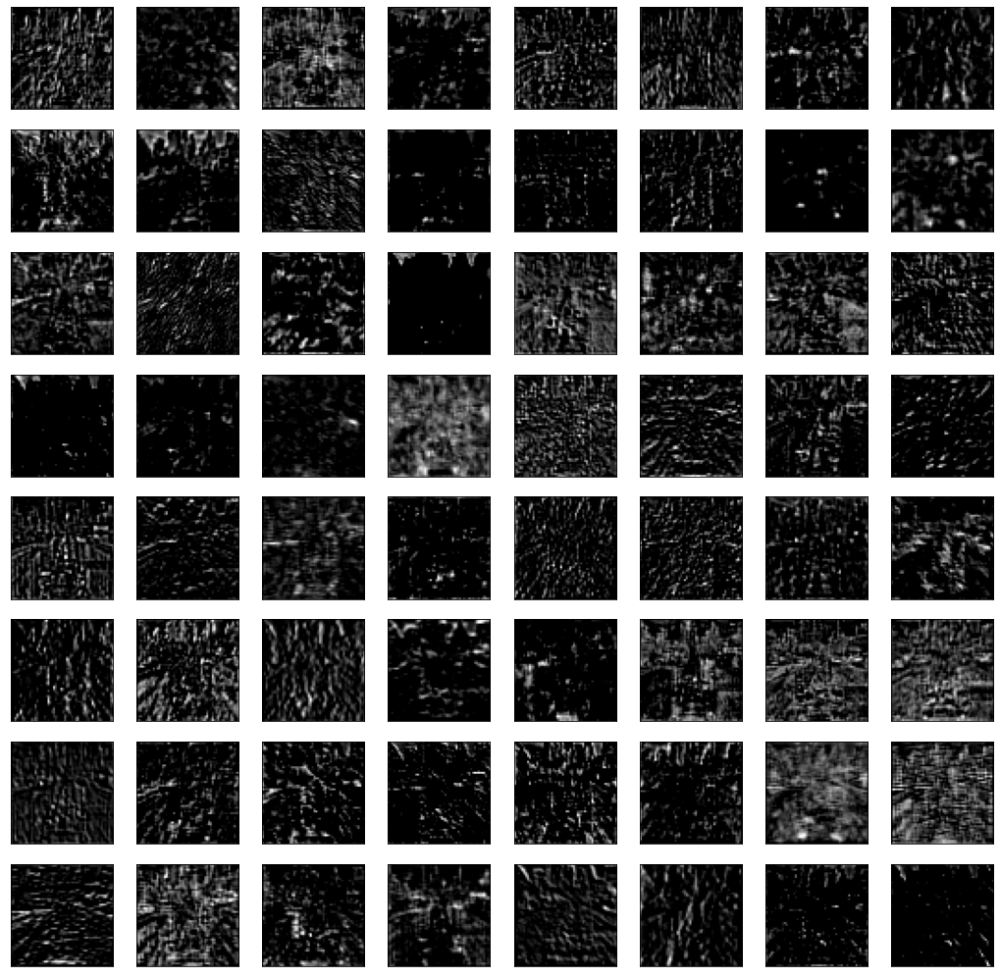

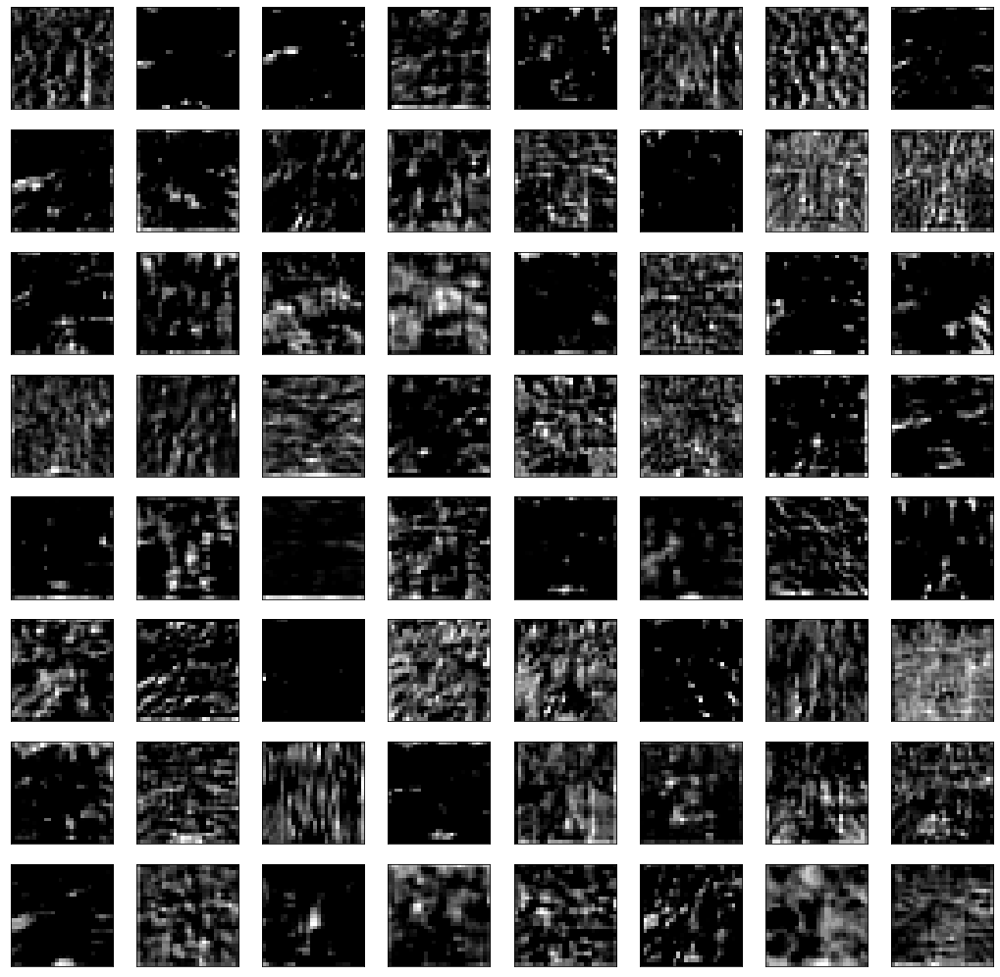

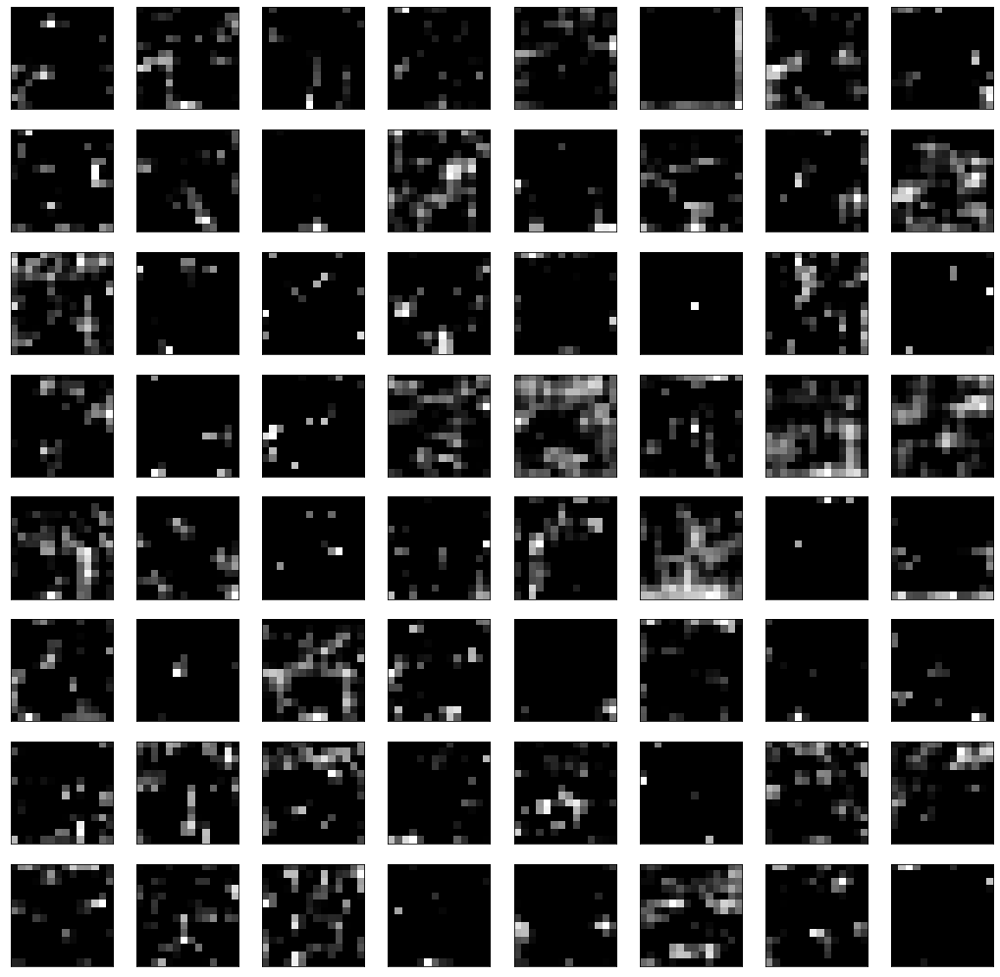

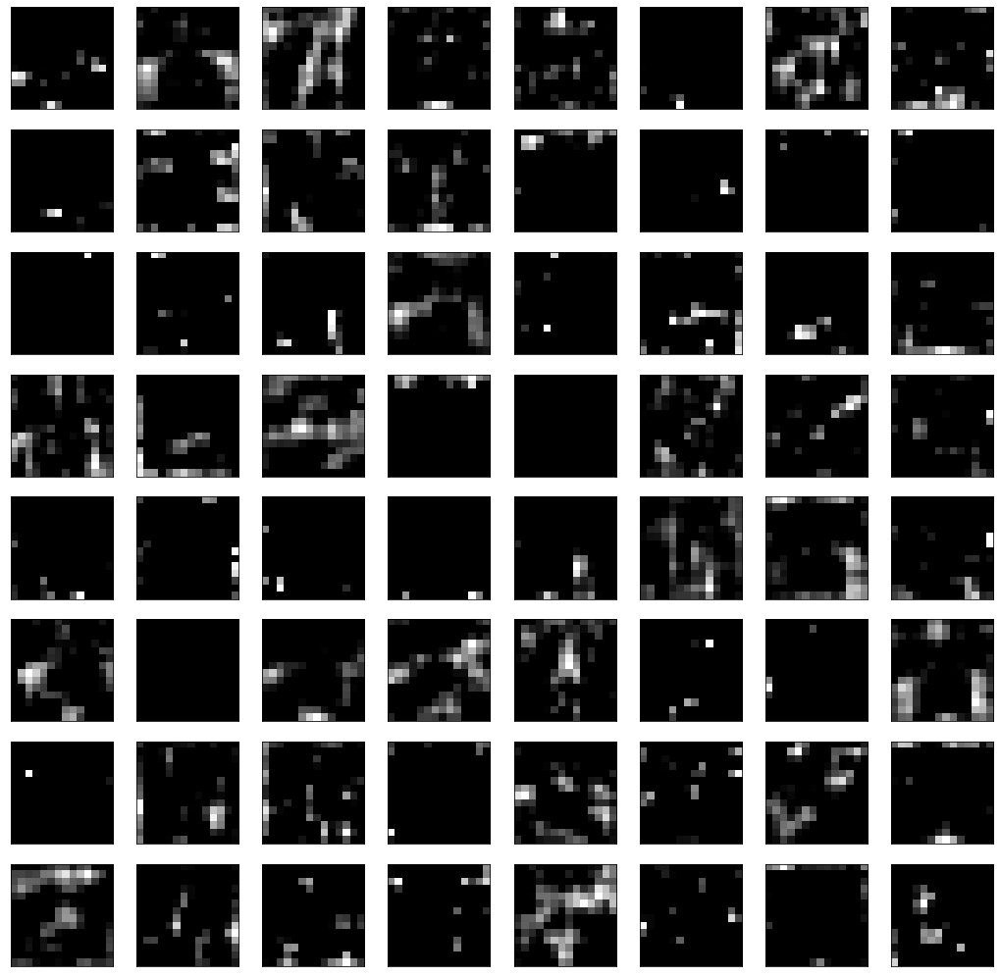

In [27]:
plot_feature_maps(feature_maps_vgg19)

Visualized objects are not very distinct, in particular in the upper layers. Thus, it is not quite clear what the CNN "sees", especially in the last filters, but such "images" were expected. If a pair of 5 hidden ResNet50 layers produce similar pictures, it could be assumed that they will hold information sufficient to transfer style and content to another one.

###### ResNet50

One content and five style ResNet50 layers are selected for visualization (to match the VGG19's number). These are the last convolutional layer in the last convolutional block of each section plus one additional, completely random layer. The code lines that follow are identical to the preceding ones, with minor adjustments to reflect ResNet50 specifics.

In [28]:
# Get index of layers to examine
resnet_layers = [2, 15, 38, 84, 152, 186]

In [29]:
# Store selected layers' ouput
outputs_resnet = [resnet50_model.layers[i].output for i in resnet_layers]

In [30]:
# Compile model with ResNet50 inputs, and selected layers output
model_resnet50 = Model(inputs = resnet50_model.inputs, outputs = outputs_resnet)

In [31]:
# Preprocess image for ResNet50
image_rn = load_img(CONTENT_PATH, target_size = (224, 224))
image_rn = img_to_array(image_rn)
image_rn = tf.expand_dims(image_rn, axis = 0)
image_rn = tf.keras.applications.resnet50.preprocess_input(image_rn)

In [32]:
# Get feature maps of selected layers
feature_maps_resnet50 = model_resnet50.predict(image_rn)

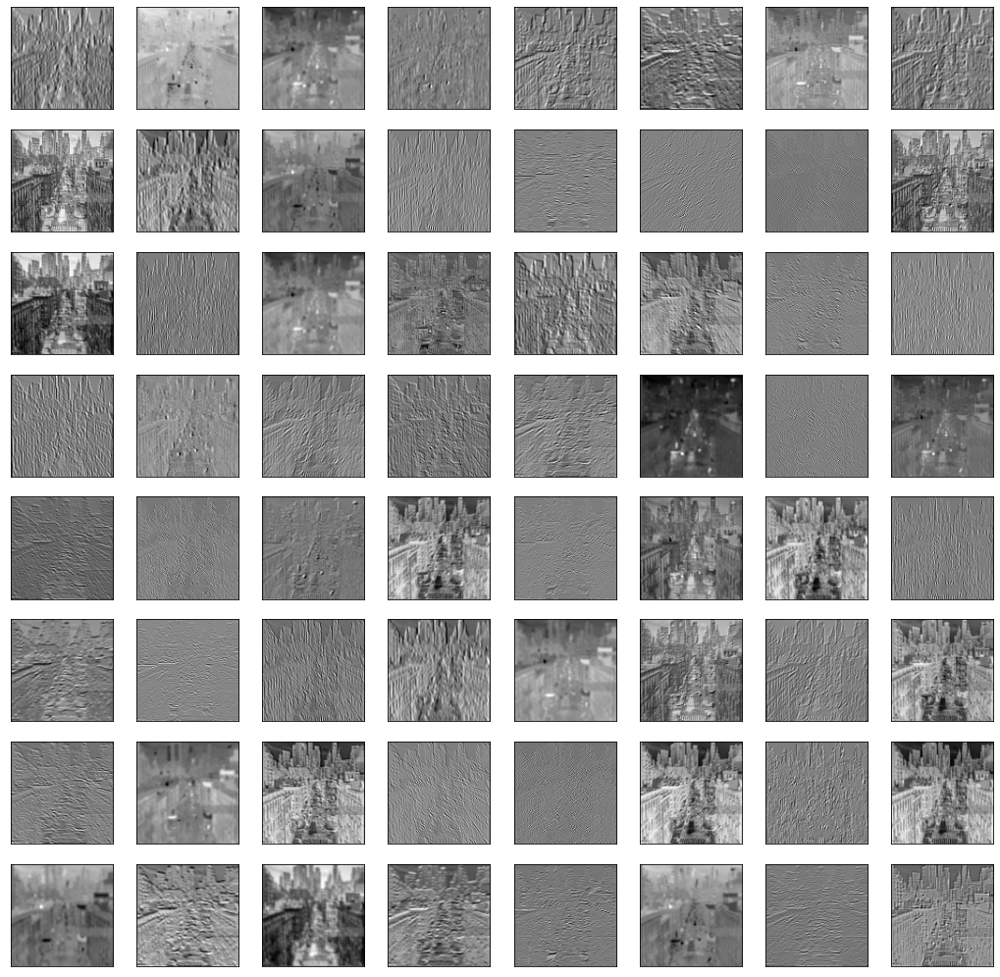

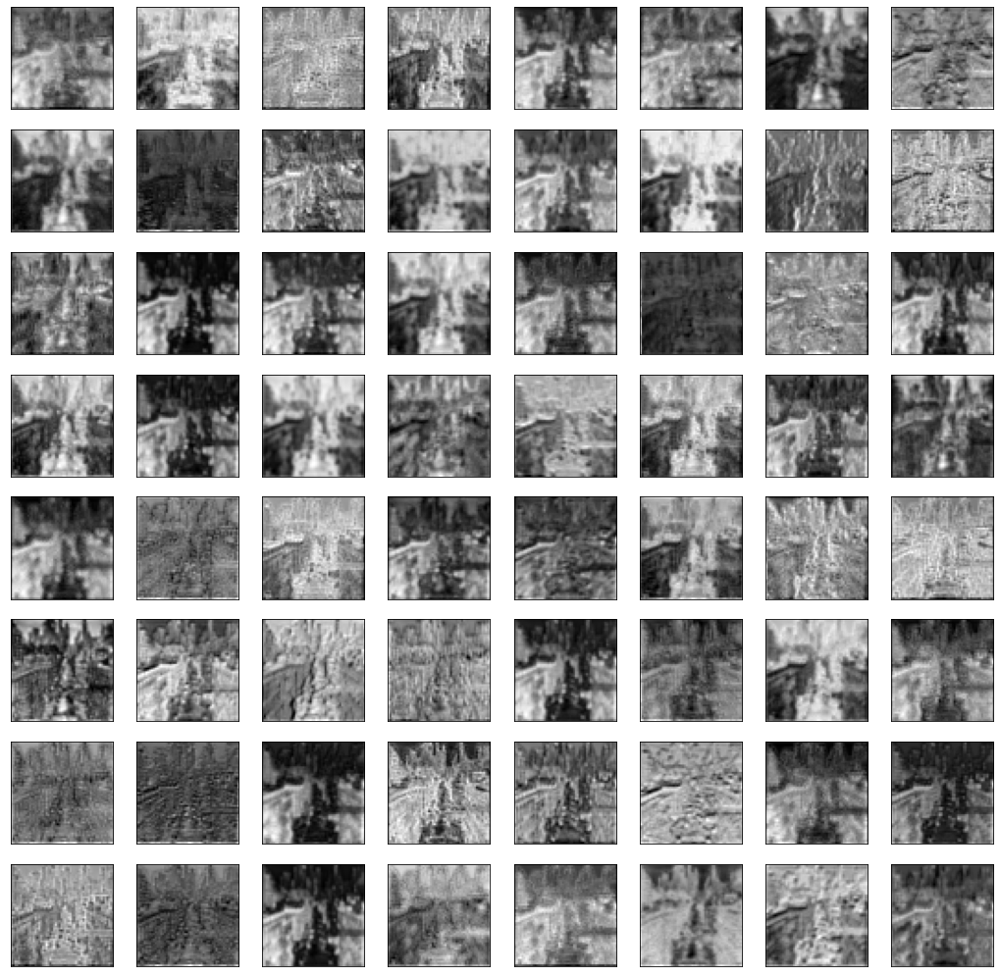

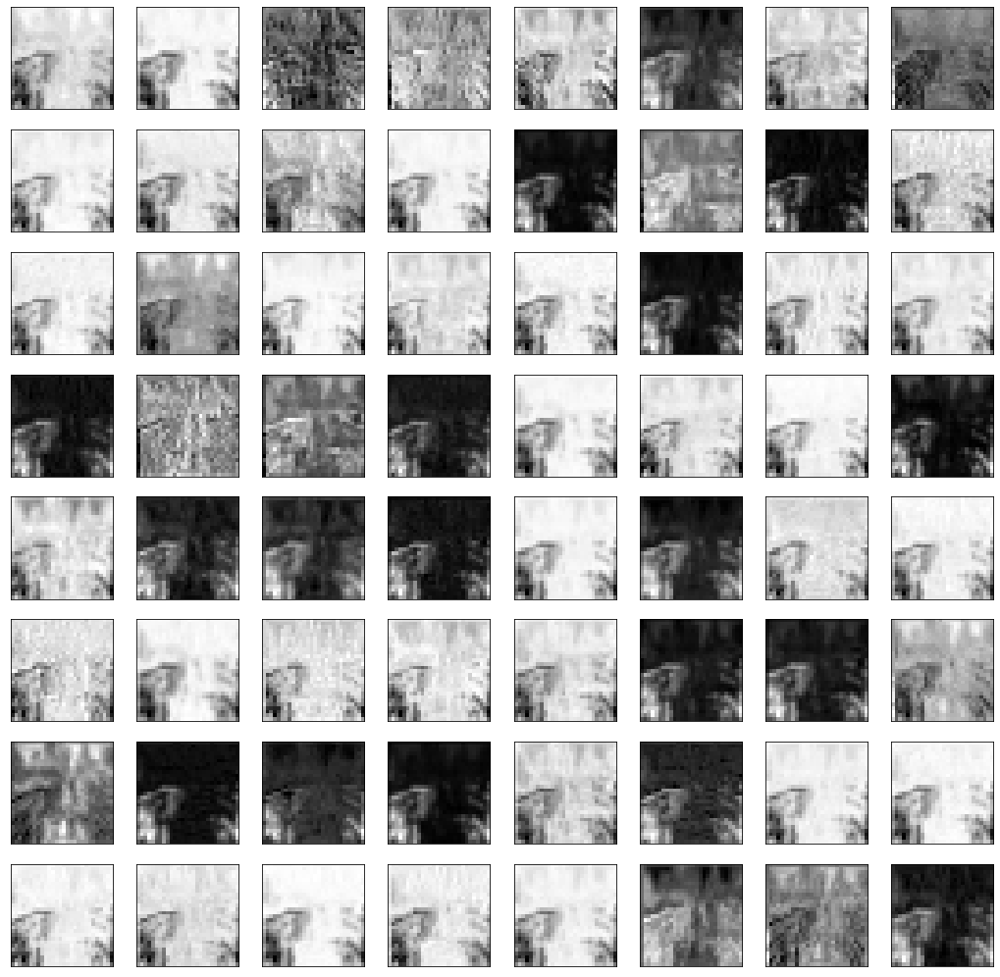

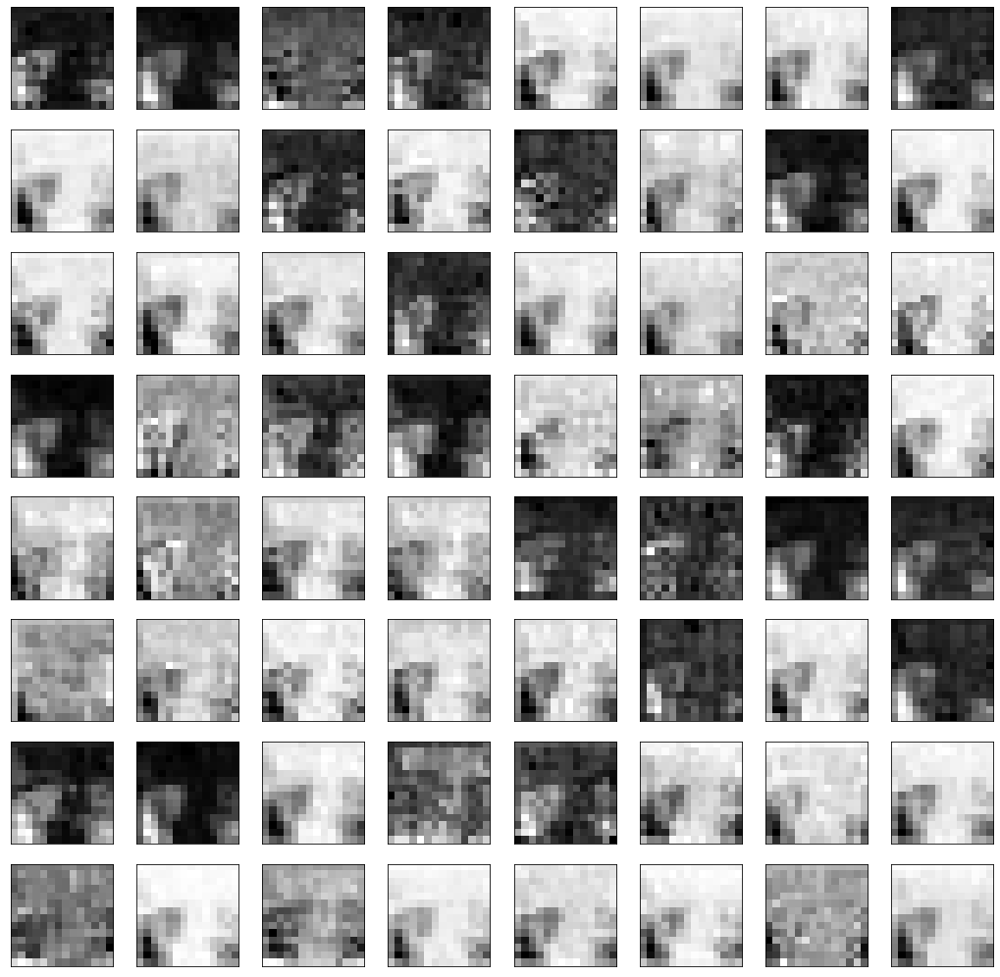

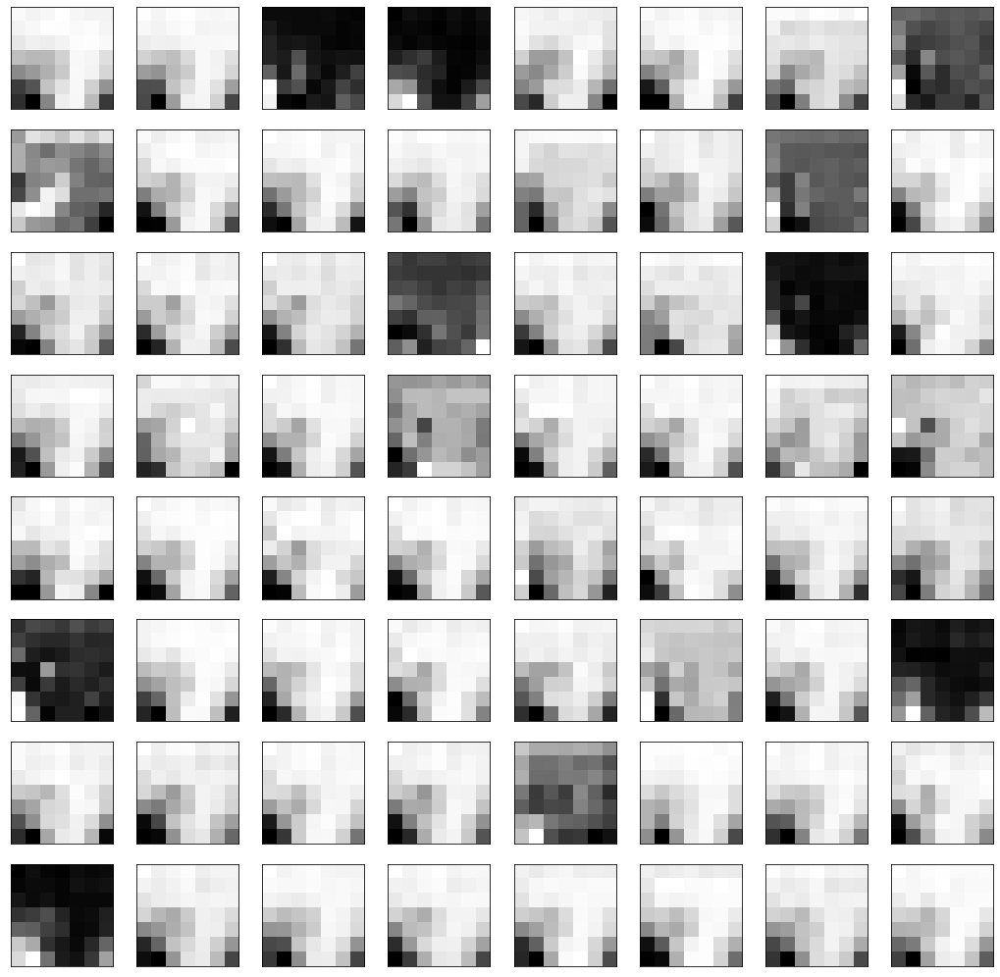

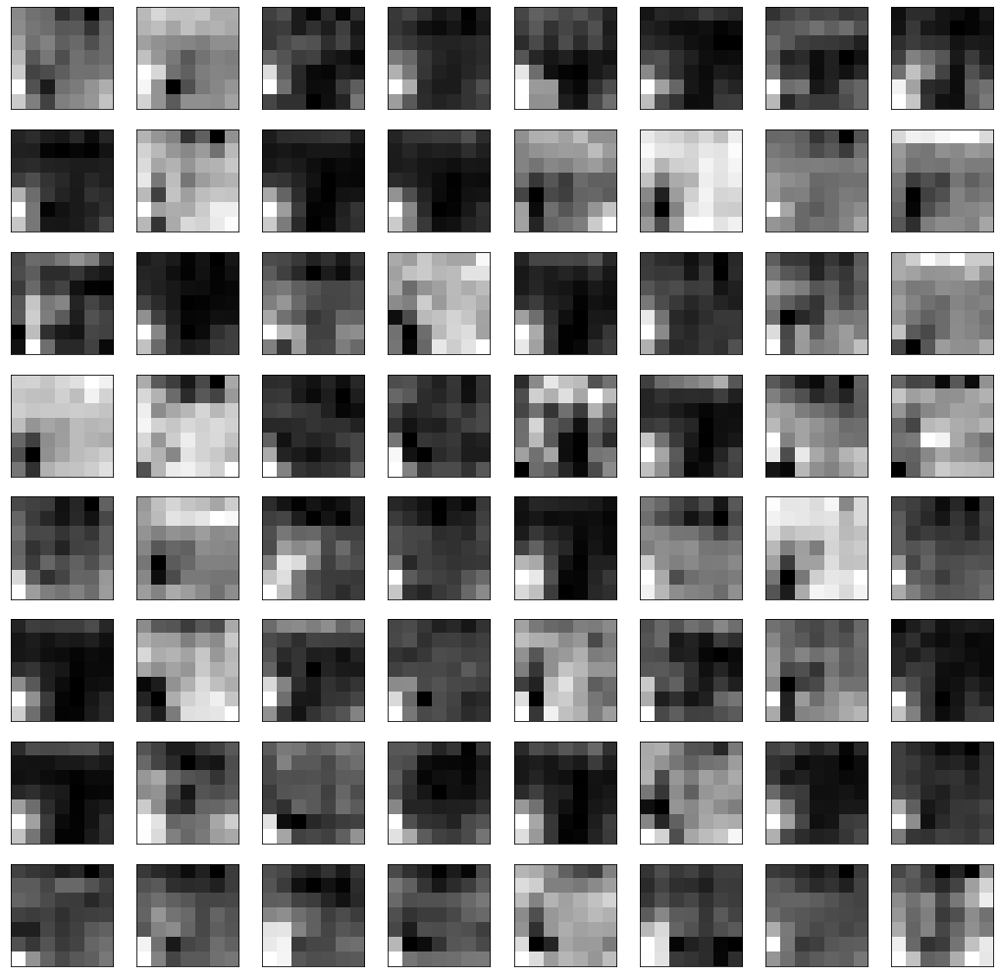

In [33]:
plot_feature_maps(feature_maps_resnet50)

The first 64 feature maps (of selected layers) are quite different from those of VGG19. Lower layers hold more "understandable" information, whereas upper ones - more abstract visuals. Nonetheless, an attempt was made to transfer style whith them. Unfortunately, it failed. For this reason, the last approach is to tune the code as **Leo Barbosa did for his experiment** (see paper "*Neural Style Transfer using ResNet50 with tf.keras"*, reference source No. 9). 

Therefore, the work proceeds with a brief recall of the fuctions used for style transfer with VGG19.

#### 3.3. Brief inventory of previous work

Thirteen functions were defined for transfering style with VGG. They are as follows:

* `load_img()` - loads an image from a path
* `imshow()` - displays an image
* `load_and_process_img()` - preprocesses an image for VGG19 architecture
* `deprocess_img()` - converts generated values back in RGB format
* `get_model()` - creates model with access to VGG19 intermediate layers
* `get_content_loss()` - computes Content loss
* `gram_matrix()` - computes correlation (Gram) values
* `get_style_loss()` - computes Style loss
* `get_feature_representations()` - feed content and style images through the network and gets outputs of intermediate leyers.
* `compute_loss()` - computes Total loss
* `compute_grads()` - computes gradients
* `run_style_transfer()` - runs Style Transfer and displays generated intermediate and final images
* `show_results()` - displays input content and style images, and generated image

An attempt was made to alter only few of them to meet ResNet50 requirements. Both architectures need different settings, and using same variables and functions led to collisions and meaningless outputs. For this reason, ResNet50 exercise had to be carried out in this Jupyter Notebook, and all functions are updated accordingly.

#### 3.4. Define new variables and functions

This is a **techincal sub-chapter**. It holds updated / adjusted functions. Explanations are purposefully omitted here.

##### Load Image

In [34]:
def load_resnet_img(path_to_img):
    """
    Function: Loads an image from a path.
    
    Arguments: Path to the image.
    
    Returns: 4D image (tensor).
    """
    max_dim = 512
    img = Image.open(path_to_img)
    long = max(img.size)
    scale = max_dim/long
    img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
    img = kp_image.img_to_array(img)
  
    # Broadcast the image array so it has a batch dimension 
    img = np.expand_dims(img, axis = 0)
    return img

##### Display Image

In [35]:
def imshow(img, title=None):
    """
    Function: Displays image.
    
    Arguments: Image and title (optional).
    
    Returns: Visualized image.
    """
    # Remove bacth dimension
    out = np.squeeze(img, axis=0)
    
    # Normalize for display
    out = out.astype('uint8')
    plt.imshow(out)
    
    # Show image title
    if title is not None:
        plt.title(title)
    plt.imshow(out)

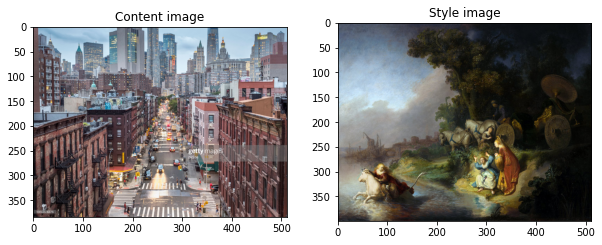

In [36]:
# Display content and style images
plt.figure(figsize = (10, 10))
content = load_resnet_img(CONTENT_PATH).astype('uint8')
style = load_resnet_img(STYLE_PATH).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, "Content image")

plt.subplot(1, 2, 2)
imshow(style, "Style image")
plt.show()

##### Load and preprocess image

In [37]:
def load_and_process_img_resnet(path_to_img):
    """
    Function: Preprocess image for ResNet use.
    
    Arguments: Path to the image.
    
    Returns: Image values for ResNet
    """
    img = load_resnet_img(path_to_img)
    img = tf.keras.applications.resnet50.preprocess_input(img)
    return img

In [38]:
load_and_process_img_resnet(CONTENT_PATH)

array([[[[ 6.0997009e-02, -1.8778999e+01, -6.8000031e-01],
         [ 4.0609970e+00, -1.4778999e+01,  3.1999969e-01],
         [ 7.0609970e+00, -1.3778999e+01,  1.3199997e+00],
         ...,
         [ 1.1006100e+02,  7.1221001e+01,  2.7320000e+01],
         [ 1.1206100e+02,  7.1221001e+01,  2.9320000e+01],
         [ 1.1106100e+02,  7.0221001e+01,  2.8320000e+01]],

        [[-3.9390030e+00, -2.2778999e+01, -4.6800003e+00],
         [ 1.0609970e+00, -1.7778999e+01, -2.6800003e+00],
         [ 3.0609970e+00, -1.7778999e+01, -1.6800003e+00],
         ...,
         [ 1.1106100e+02,  7.2221001e+01,  2.8320000e+01],
         [ 1.1206100e+02,  7.1221001e+01,  2.9320000e+01],
         [ 1.1106100e+02,  7.0221001e+01,  2.8320000e+01]],

        [[-6.9390030e+00, -2.5778999e+01, -7.6800003e+00],
         [-2.9390030e+00, -2.1778999e+01, -3.6800003e+00],
         [-1.9390030e+00, -2.0778999e+01, -4.6800003e+00],
         ...,
         [ 1.1106100e+02,  7.2221001e+01,  2.9320000e+01],
         [

In [39]:
print("Minimum value in image: {}".format(load_and_process_img_resnet(CONTENT_PATH).min()))
print("Maximum value in image: {}".format(load_and_process_img_resnet(CONTENT_PATH).max()))

Minimum value in image: -123.68000030517578
Maximum value in image: 151.06100463867188


##### Deprocess Image

In [40]:
def deprocess_img_resnet(processed_img):
    """
    Function: Converts ResNet computed values in RGB format.
    
    Arguments: Processed image.
    
    Returns: Converted image.
    """
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    assert len(x.shape) == 3
    if len(x.shape) != 3:
        raise ValueError("Invalid input to deprocessing image")
  
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype('uint8')
    return x

##### Define Style and Representation

Leo Barbosa explicitly warns to not select layers without parameters. He explaines that usually, one layer for content seems to work fine. 
For style layers one should identify the layers that work best. Barbosa made several trial and error to find the best combination.

In [41]:
resnet_content_layers = ["conv1_conv"]

In [42]:
resnet_style_layers = ["conv2_block3_1_conv",
                       "conv3_block2_preact_bn",
                       "conv3_block3_preact_bn",
                       "conv4_block4_2_bn"]

In [43]:
num_resnet_content_layers = len(resnet_content_layers)
num_resnet_style_layers = len(resnet_style_layers)

In [44]:
print(num_resnet_content_layers)
print(num_resnet_style_layers)

1
4


##### Get Model

Barbosa thinks that ResNet50's complexity is a reason the feature maps not to work as well as those of VGG16 or VGG19. Obtain better generated image requires several trials and errors using different combinations for content and style.

In [45]:
def get_resnet_model():
    """
    Function: Creates ResNet model with access to intermediate layers. 
    
    Arguments: None.
    
    Returns: a Keras ResNet model that takes image inputs and outputs the style and content intermediate layers.
    """
    # Load pretrained ResNet50, trained on imagenet data; freeze weights
    resnet = resnet_v2.ResNet50V2(include_top = False, weights = "imagenet")
    resnet.trainable = False

    # Get output layers corresponding to style and content layers 
    style_outputs = [resnet.get_layer(name).output for name in resnet_style_layers]
    content_outputs = [resnet.get_layer(name).output for name in resnet_content_layers]
    model_outputs = style_outputs + content_outputs
  
    # Build model
    return Model(resnet.input, model_outputs)

##### Get Content Loss

In [46]:
def get_content_loss(base_content, target):
    """
    Function: Computes content loss. 
    
    Arguments: Image to be generated, original image 'p'.
    
    Returns: Mean square error between generated and original image.
    """
    return tf.reduce_mean(tf.square(base_content - target))

##### Get Style Loss

In [47]:
def gram_matrix(input_tensor):
    """
    Function: Computes Correlation (Gram) values. 
    
    Arguments: Image (tensor).
    
    Returns: Gram matrix.
    """
    # Make the image channels first 
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a = True)
    return gram / tf.cast(n, tf.float32)

In [48]:
def get_style_loss(base_style, gram_target):
    """
    Function: Computes Style loss. 
    
    Arguments: Expects generated image and original image.
    
    Returns: Style loss.
    """
    # height, width, num filters of each layer
    # Scale loss at a given layer by the size of the feature map and the number of filters
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)

    # / (4. * (channels ** 2) * (width * height) ** 2)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

##### Get Feature Representations

In [49]:
def get_resnet_feature_representations(model, content_path, style_path):
    """
    Function: Loads and preprocess both content and style images
                from their path. Thereafter, the function will feed them through
                ResNet50 network to get outputs of the intermediate leyers.
    
    Arguments: model: The model that will be used.
                content_path: The path to the content image.
                style_path: The path to the style image
    
    Returns: The style features and the content features.
    """
    # Load images in
    content_image = load_and_process_img_resnet(content_path)
    style_image = load_and_process_img_resnet(style_path)

    # batch compute content and style features
    content_outputs = model(content_image)
    style_outputs = model(style_image)
  
    # Get style and content feature representations from model  
    style_features = [style_layer[0] for style_layer in style_outputs[:num_resnet_style_layers]]
    content_features = [content_layer[0] for content_layer in content_outputs[num_resnet_style_layers:]]
    
    return style_features, content_features

##### Compute Total Loss

In [50]:
def compute_resnet_loss(model, loss_weights, init_image, gram_style_features, content_features): 
    """
    Function: Computes Total loss for ResNet.
    
    Arguments: model: ResNet50 model that will give access to the intermediate layers 
                loss_weights: The weights of each contribution of each loss function. 
                      (style weight, content weight, and total variation weight)
                init_image: The initial base image. This image is what is updated with the optimization process. 
                        Gradients are applied with regard to the loss that is being calculated to this image.
                gram_style_features: Precomputed gram matrices corresponding to the defined style layers of interest.
                content_features: Precomputed outputs from defined content layers of interest.
    
    Returns: Total loss, Style loss, and Content loss.
    """
    
    style_weight, content_weight = loss_weights

    # Feed init image through model. This will give content and 
    # style representations at desired layers.
    model_outputs = model(init_image)
  
    style_output_features = model_outputs[:num_resnet_style_layers]
    content_output_features = model_outputs[num_resnet_style_layers:]
  
    style_score = 0
    content_score = 0

    # Accumulate style losses from all layers
    # Equally weight each contribution of each loss layer
    weight_per_style_layer = 1.0 / float(num_resnet_style_layers)
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
    # Accumulate content losses from all layers
    weight_per_content_layer = 1.0 / float(num_resnet_content_layers)
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
    style_score *= style_weight
    content_score *= content_weight

    # Get total loss
    loss = style_score + content_score 
    return loss, style_score, content_score

##### Compute Gradients

In [51]:
def compute_grads(cfg):
    """
    Function: Computes gradients.
    
    Arguments: Data used for computing the previous loss function.
    
    Returns: A list of gradients, one for each element of target, and all losses.
    """
    with tf.GradientTape() as tape: 
        all_loss = compute_resnet_loss(**cfg)

    # Compute gradients wrt input image
    total_loss = all_loss[0]
    return tape.gradient(total_loss, cfg['init_image']), all_loss

##### Define function for Running Style Transfer

In [52]:
OPTIMIZER = tf.keras.optimizers.Adam(learning_rate = 20, beta_1 = 0.99, epsilon = 1e-1)
# RMSprop(learning_rate = 0.01)
# Adam(learning_rate = 5, beta_1 = 0.99, epsilon = 1e-1)
# Nadam(learning_rate = 0.001, beta_1=0.9, epsilon=1e-07)

In [53]:
def run_resnet_style_transfer(content_path, 
                       style_path,
                       num_iterations = 1000,
                       content_weight = 1e3, 
                       style_weight = 1e-2): 
    """
    Function:   Runs style transfer with ResNet and displays the generated intermediate and final images.
    
    Arguments:  Paths to content image and to style image, number of iterations
                content weight, and style weight.
    
    Returns:    The best image generated with style transfer, total loss minimum.
    """
    
    # No need to train any layers, so trainable layers are set to false. 
    resnet_model = get_resnet_model() 
    for layer in resnet_model.layers:
        layer.trainable = False
  
    # Get style and content feature representations from specified intermediate layers 
    style_features, content_features = get_resnet_feature_representations(resnet_model, content_path, style_path)
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
    # Set initial image (white noise)
    init_image = load_and_process_img_resnet(content_path)
    init_image = tf.Variable(init_image, dtype = tf.float32)
  
    # Create optimizer
    opt = OPTIMIZER

    # Display intermediate images 
    iter_count = 1
  
    # Store best result
    best_loss, best_img = float('inf'), None
  
    # Create a nice configuration 
    loss_weights = (style_weight, content_weight)
    cfg = {
            "model": resnet_model,
            "loss_weights": loss_weights,
            "init_image": init_image,
            "gram_style_features": gram_style_features,
            "content_features": content_features
    }
    
    # Display content, style and generated images
    num_rows = 2
    num_cols = 5
    display_interval = num_iterations / (num_rows * num_cols)
    start_time = time.time()
    global_start = time.time()
  
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means   
  
    imgs = []
    for i in range(num_iterations):
        grads, all_loss = compute_grads(cfg)
        loss, style_score, content_score = all_loss
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, min_vals, max_vals)
        init_image.assign(clipped)
        end_time = time.time() 
    
        if loss < best_loss:
            # Update best loss and best image from total loss. 
            best_loss = loss
            best_img = deprocess_img_resnet(init_image.numpy())

        if i % display_interval == 0:
            start_time = time.time()
        
            # Use the .numpy() method to get the concrete numpy array
            plot_img = init_image.numpy()
            plot_img = deprocess_img_resnet(plot_img)
            imgs.append(plot_img)
            IPython.display.clear_output(wait = True)
            IPython.display.display_png(Image.fromarray(plot_img))
            print("Iteration: {}".format(i))        
            print("Total loss: {:.4e}, " 
                    "style loss: {:.4e}, "
                    "content loss: {:.4e}, "
                    "time: {:.4f}s".format(loss, style_score, content_score, time.time() - start_time))
    print("Total time: {:.4f}s".format(time.time() - global_start))
    IPython.display.clear_output(wait = True)
    plt.figure(figsize = (14, 4))
    for i,img in enumerate(imgs):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
      
    return best_img, best_loss

#### 3.5. Run Style Transfer on ResNet50

##### Run Style Transfer with New York and Rembrandt

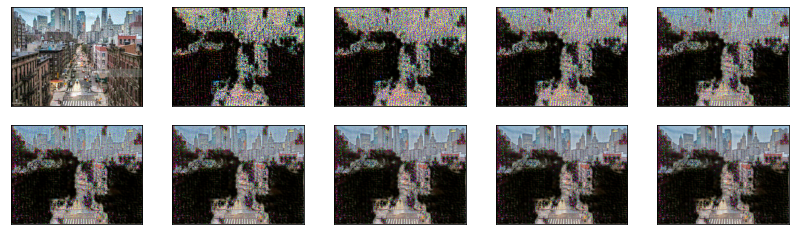

In [54]:
resnet_best, resnet_best_loss = run_resnet_style_transfer(CONTENT_PATH, 
                                     STYLE_PATH, 
                                     num_iterations = 1000)

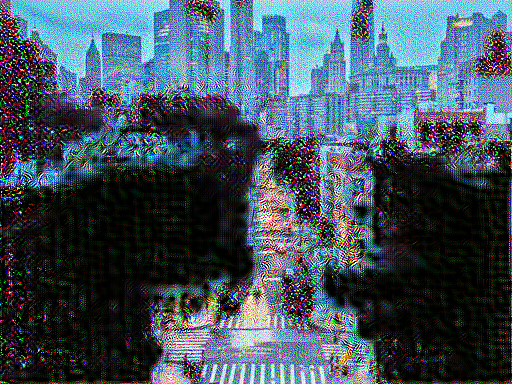

In [55]:
Image.fromarray(resnet_best)

##### Run Style Transfer with Maldives and Monet

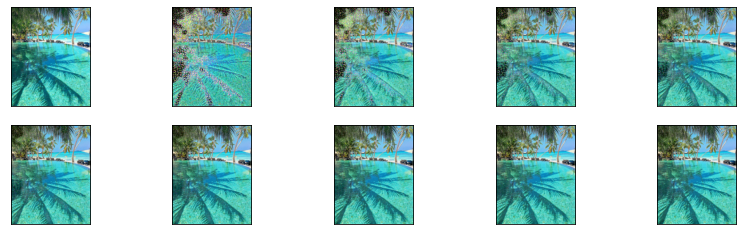

In [56]:
resnet_best_1, resnet_best_loss_1 = run_resnet_style_transfer(CONTENT_PATH_1, 
                                     STYLE_PATH_1, 
                                     num_iterations = 1000)

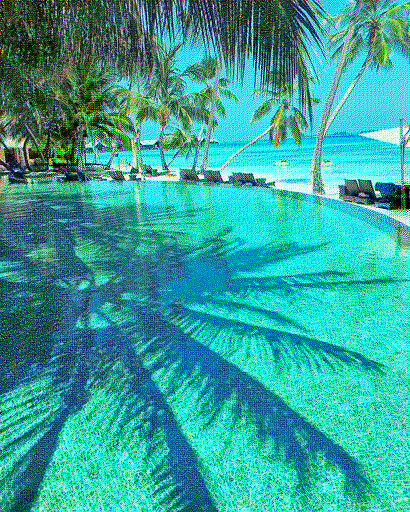

In [57]:
Image.fromarray(resnet_best_1)

##### Run Style Transfer with 'Stars over a beach' and 'Starry Night' by Van Gogh

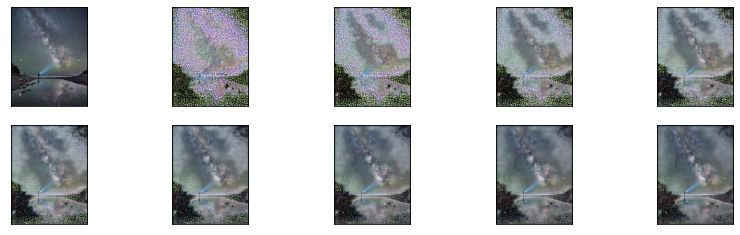

In [58]:
resnet_best_2, resnet_best_loss_2 = run_resnet_style_transfer(CONTENT_PATH_2, 
                                     STYLE_PATH_2, 
                                     num_iterations = 1000)

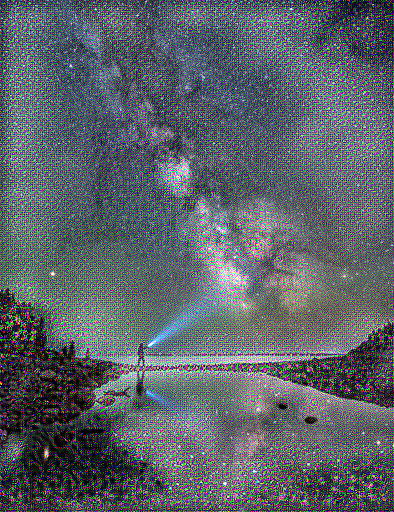

In [59]:
Image.fromarray(resnet_best_2)

A look at first pairs' loss values shows that the total loss diminishes with each iteration. Style loss is also reduced but still it is not suficiently transfered. Content loss decreases with much smaller rates. Furthermore, and most important, all losses are much higher than those attained with VGG19 model.

`Iteration: 0: Total loss: 3.3631e+11, style loss: 3.3631e+11, content loss: 0.0000e+00, time: 0.0748s`

`Iteration: 100: Total loss: 5.1775e+08, style loss: 4.8913e+08, content loss: 2.8614e+07, time: 0.1183s`

`Iteration: 200: Total loss: 1.7421e+08, style loss: 1.4612e+08, content loss: 2.8092e+07, time: 0.1177s`

`Iteration: 300: Total loss: 8.4184e+07, style loss: 6.0362e+07, content loss: 2.3822e+07, time: 0.1315s`

`Iteration: 400: Total loss: 5.3250e+07, style loss: 3.4331e+07, content loss: 1.8919e+07, time: 0.1003s`

`Iteration: 500: Total loss: 3.9214e+07, style loss: 2.3779e+07, content loss: 1.5435e+07, time: 0.1058s`

`Iteration: 600: Total loss: 3.1419e+07, style loss: 1.8335e+07, content loss: 1.3085e+07, time: 0.0997s`

`Iteration: 700: Total loss: 2.6453e+07, style loss: 1.5021e+07, content loss: 1.1432e+07, time: 0.1013s`

`Iteration: 800: Total loss: 2.3173e+07, style loss: 1.2937e+07, content loss: 1.0236e+07, time: 0.1267s`

`Iteration: 900: Total loss: 2.0831e+07, style loss: 1.1506e+07, content loss: 9.3255e+06, time: 0.0847s`

#### 3.6. Visualize Style Transfer on ResNet50

In [60]:
def show_results(best_img, content_path, style_path, show_large_final=True):
    """
    Function:   Displays input content and style images, and generated image.
    
    Arguments:  Generated image, paths to content and style input images.
    
    Returns:    Content image, Style image, Generated image.
    """
    plt.figure(figsize = (10, 5))
    content = load_resnet_img(content_path) 
    style = load_resnet_img(style_path)

    plt.subplot(1, 2, 1)
    imshow(content, "Content Image")

    plt.subplot(1, 2, 2)
    imshow(style, "Style Image")

    if show_large_final: 
        plt.figure(figsize=(10, 10))

        plt.imshow(best_img)
        plt.title("Output Image")
        plt.show()

Only the first pair of images are visualized below. It should be noted here that various combinations of hyper-parameters were tested for improving outcomes. Gatys et al.[2] used "Adam" optimizer to transfer style in their tests. 

Here, the learing rate was reduced (to 5) but results were meaningless. Instead of "Adam", gradient descent was calculated with "RMSProp" with learning rate higher than the default one. Initial imgae didn't change as if it didn't get no style. For this reason, "style_weight" was increaded (e.g. from 1e-3 to 1e2) and "content_weight" - reduced (e.g. from 1e4 to 1e-2). Output didn't change.

"Nadam" - another optimization algorithm (with default settings) was also tried, and it also didn't extract any style features. Therefore, further computations were made only with "Adam" again. Its learning was increased to 25, also of no avail. It seems that neither algorithm, neither combination between "style_weight" and "content_weight" would work. For this reason, last attempt was made with all default (Barbosa) settings but the style layers. `resnet_style_layers` got all ResNet50 layers having any parameter. Its length reached 100. The result was even more terrible.

Thus, it seems it is impossible to extract style with ResNet50 layers regardless of their complexity and size. Hence, Style Transfer with such architecture is most likely doomed to fail.

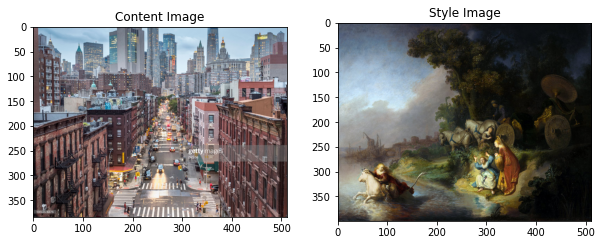

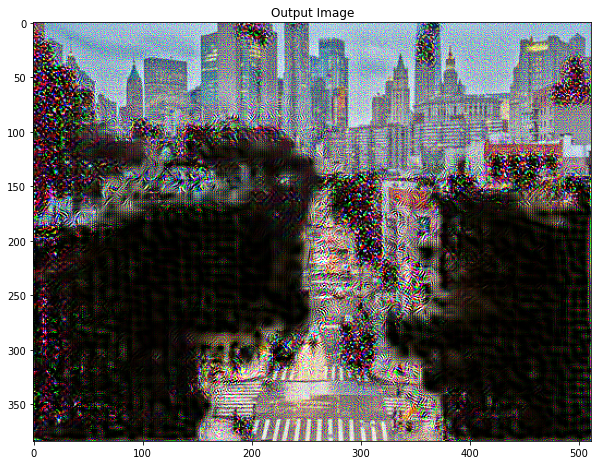

In [61]:
show_results(resnet_best, CONTENT_PATH, STYLE_PATH)

A post in [Reddit] suggests 4 hypotheses why VGG outperforms other architectures. These are copy-pasted below with minor cuts.
    
> 1. VGG is so big that it is incidentally capturing a lot of information that the other models discard and accidentally generalizing better despite worse task-specific performance. (Do resnets in general do transfer-learning worse, compared to earlier CNNs, than would be expected based on their superior task-specific performance?)

>But while VGG is giant compared to other ImageNet models, 500M vs <50MB (Keras table), most of this appears to be coming from the Fully-connected layers rather than the convolutions being sampled (leaving 58/80MB for the rest), so where is the supposed knowledge being stored? Nor does VGG appear to have tame internal dynamics lacking in other models - the layer average norms differ greatly, and rescaling appears to be unnecessary.

>On the gripping hand, could the Fully-connected layers in some way be forcing the lower convolutions to be different in terms of abstractions than equivalent convolutions in later less-Fully-connected-heavy models?

>2. ResNets are unrolled iteration/shallow ensembles: the features do exist but they are too spread out to be pulled out easily and the levels of abstraction are all mixed up - instead of getting a nice balance of features from the bottom and top, they're spread out wildly between layer #3 and #33 and #333 etc. While VGGs, being relatively shallow and modular and having no residual connections or other special tricks to smuggle raw information up the layers, are forced to create more of a clearcut hierarchical pyramid of abstractions.

>Alternately, perhaps ResNet/densenet layer activations need to be de-summed/de-concatenated.

> 3. Residual connections themselves somehow mess up the optimization procedure by affecting properties like independence of features, with "blurring" from layers so easily passing around activations, suggests Kyle Kastner (this might be the same thing as "resnets have too many layers & split up features")

>4. VGG's better performance is due to not downsampling aggressively, doing so only after two convolutions and then max pooling. In this interpretation, GoogLeNet fails because it downsamples in the first layer.

VGG architecture differs from ResNet and Inception in that is has no skip connections and ramifications. Thus, it is interesting to check if a shallower network trained on much, much smaller dataset could extract style and content from images and to mix them. This is performed in **Chapter No. 4**, implemented in another Notebook.

$$------------------------ \nabla ----- \nabla ----- \nabla ------------------------ $$